In [1]:

import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np

# from Kea.utils import plotting
# plotting.modify_rc()

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.axes as maxes

import seaborn as sns

def modify_rc():
    mpl.rcParams['figure.dpi'] = 250
    mpl.rc('text', usetex=True)
    mpl.rc('text.latex', preamble=r'''\usepackage{bm}
\usepackage{xcolor}
\usepackage{mathrsfs, amsmath, amssymb, amsthm, amsxtra}''')
    #mpl.rcParams['text.latex.preamble']=[r"\usepackage{bm}", r"\usepackage{xcolor}"]
    mpl.rc('font', family='serif', serif='Computer Modern', size=8)

modify_rc()
modify_rc()

def pretty_axes(axx):
    axx.yaxis.set_ticks_position('both')
    axx.xaxis.set_ticks_position('both')
    axx.tick_params(axis='y', direction='in')
    axx.tick_params(axis='y', direction='in', which='minor')
    axx.tick_params(axis='x', direction='in')
    axx.tick_params(axis='x', direction='in', which='minor')
    axx.grid(linestyle=':', alpha=0.3, linewidth=0.5, color='gray')

# import healpy as hp
from astropy.io import fits
from astropy.wcs import WCS
# import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.nddata import Cutout2D
from reproject import reproject_interp
from astropy.wcs.utils import skycoord_to_pixel
from scipy.ndimage import map_coordinates

import healpy as hp

import utils

import cmasher as cmr


In [2]:
import pysm3 as sm
import pysm3.units as u

In [3]:
sky6 = sm.Sky(nside=1024, preset_strings=['s6'])
sky8 = sm.Sky(nside=1024, preset_strings=['s8'])

/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/fitsfunc.py:643: ComplexWarning: Casting complex values to real discards the imaginary part
  alm.real[i] = almr
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/fitsfunc.py:644: ComplexWarning: Casting complex values to real discards the imaginary part
  alm.imag[i] = almi
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/fitsfunc.py:643: ComplexWarning: Casting complex values to real discards the imaginary part
  alm.real[i] = almr
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/fitsfunc.py:644: ComplexWarning: Casting complex values to real discards the imaginary part
  alm.imag[i] = almi


generating monofractal field


/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/sphtfunc.py:607: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asarray(cl, dtype=np.float64) if cl is not None else None)
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/sphtfunc.py:563: ComplexWarning: Casting complex values to real discards the imaginary part
  cls_list = [np.asarray(cls, dtype=np.float64)]
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/fitsfunc.py:643: ComplexWarning: Casting complex values to real discards the imaginary part
  alm.real[i] = almr
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/fitsfunc.py:644: ComplexWarning: Casting complex values to real discards the imaginary part
  alm.imag[i] = almi
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/fitsfunc.py:643: ComplexWarning: Casting complex values to real discards the imaginary part
  alm.real[i] = almr
/home/m/anaconda3/envs/pysm/lib/python3.12/

generating multifractal field


/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/sphtfunc.py:607: ComplexWarning: Casting complex values to real discards the imaginary part
  (np.asarray(cl, dtype=np.float64) if cl is not None else None)
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/pysm3/models/power_law_realization.py:200: ComplexWarning: Casting complex values to real discards the imaginary part
  f_real[i] = np.sqrt(var2) * f_real[i] / np.sqrt(curr_var)
/home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/healpy/sphtfunc.py:563: ComplexWarning: Casting complex values to real discards the imaginary part
  cls_list = [np.asarray(cls, dtype=np.float64)]


-0.32666876817047796 0.308194218910101
/usr/local/texlive/2024/bin/x86_64-linux/luatex --luaonly /home/m/anaconda3/envs/pysm/lib/python3.12/site-packages/matplotlib/mpl-data/kpsewhich.lua


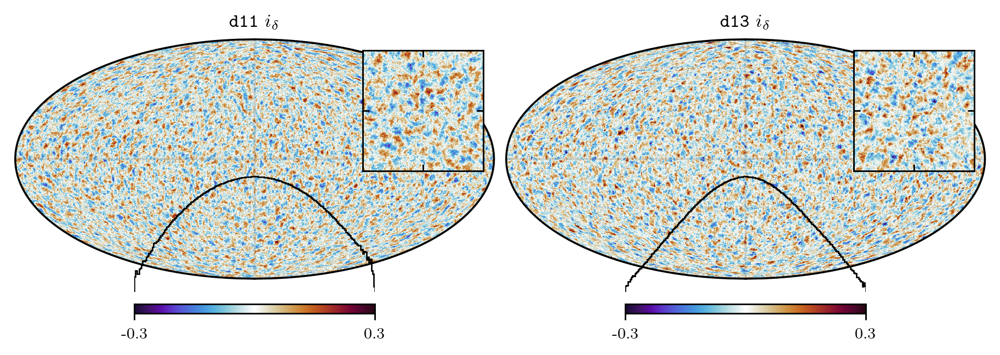

In [4]:

lon1 = 145.
lat1 = 0.
NPIX = 2048
DELTA_PIX = 1.7/60.
w = utils.w_object(NPIX, DELTA_PIX, lon1, lat1)
(w, patch) = utils.patch_creation(NPIX, DELTA_PIX, lon1, lat1)

field1 = sky6.components[0].f_real[0]
field2 = sky8.components[0].f_real[0]
print(np.nanmin(field1), np.nanmax(field1))

fig = plt.figure(figsize=(7., 3.5), dpi=256)
cmin, cmax = -0.3, 0.3
cmap2 = cmr.fusion_r
hp.mollview(field1, cmap=cmap2, title=r'\texttt{d11} $i_\delta$', fig=fig, sub=(1, 2, 1), min=cmin, max=cmax)
ax = plt.gca()
map = utils.fill_patch(w, patch, field1)
inset_ax = ax.inset_axes([0.6, 0.45, 0.5, 0.5])
inset_ax.imshow(map, cmap=cmap2, vmin=cmin, vmax=cmax, interpolation='none', origin='lower')
utils.pretty_axes(inset_ax)
inset_ax.set_xticks([0, NPIX//2, NPIX-1])
inset_ax.set_yticks([0, NPIX//2, NPIX-1])
inset_ax.set_xticklabels([])
inset_ax.set_yticklabels([])
inset_ax = ax.inset_axes([0.25, -0.05, 0.5, 0.5])
inset_ax.stairs(*utils.make_hist(field1, density=True, rescale=False, range=(cmin, cmax)), edgecolor='black', linewidth=0.75)
inset_ax.set_yscale('log')
inset_ax.set_xlim((cmin, cmax))
inset_ax.set_axis_off()

hp.mollview(field2, cmap=cmap2, title=r'\texttt{d13} $i_\delta$', fig=fig, sub=(1, 2, 2), min=cmin, max=cmax)
hp.graticule(alpha=0.25, color='gray')
ax = plt.gca()
map = utils.fill_patch(w, patch, field2)
inset_ax = ax.inset_axes([0.6, 0.45, 0.5, 0.5])
inset_ax.imshow(map, cmap=cmap2, vmin=cmin, vmax=cmax, interpolation='none', origin='lower')
utils.pretty_axes(inset_ax)
inset_ax.set_xticks([0, NPIX//2, NPIX-1])
inset_ax.set_yticks([0, NPIX//2, NPIX-1])
inset_ax.set_xticklabels([])
inset_ax.set_yticklabels([])
inset_ax = ax.inset_axes([0.25, -0.05, 0.5, 0.5])
inset_ax.stairs(*utils.make_hist(field2, density=True, rescale=False, range=(cmin, cmax)), edgecolor='black', linewidth=0.75)
inset_ax.set_yscale('log')
inset_ax.set_xlim((cmin, cmax))
inset_ax.set_axis_off()


In [5]:
field2 = sky6.get_emission(23.*u.GHz).to('uK_CMB', equivalencies=u.cmb_equivalencies(23.*u.GHz)).value
field3 = sky8.get_emission(23.*u.GHz).to('uK_CMB', equivalencies=u.cmb_equivalencies(23.*u.GHz)).value

1.595655924696239 3.3128590515619067


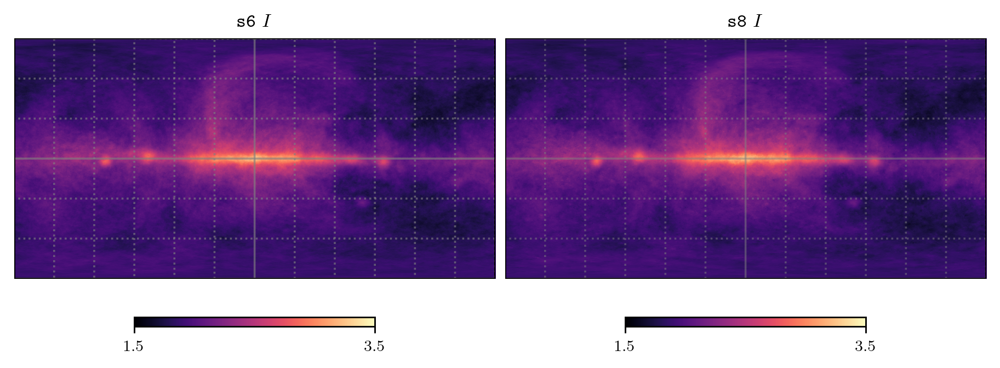

In [6]:

# field1 = sky1.get_emission(23.*u.GHz).to('uK_CMB', equivalencies=u.cmb_equivalencies(23.*u.GHz)).value

# P1 = np.sqrt(field1[1]**2 + field1[2]**2)
P2 = np.log10(field2[0])#np.sqrt(field2[1]**2 + field2[2]**2)
P3 = np.log10(field3[0])#np.sqrt(field3[1]**2 + field3[2]**2)

lon1 = 145.
lat1 = 0.
NPIX = 2048
DELTA_PIX = 1.7/60.
w = utils.w_object(NPIX, DELTA_PIX, lon1, lat1)
(w, patch) = utils.patch_creation(NPIX, DELTA_PIX, lon1, lat1)

fig = plt.figure(figsize=(7., 3.5), dpi=256)
cmin, cmax = 1.5, 3.5
print(np.nanmin(P3), np.nanmax(P3))
cmap2 = sns.color_palette('magma', as_cmap=True)#cmr.fusion_r

im1 = hp.cartview(P2, cmap=cmap2, title=r'\texttt{s6} $I$', fig=fig, sub=(1, 2, 1), min=cmin, max=cmax, xsize=4096, return_projected_map=True)
hp.graticule(alpha=0.25, color='gray')

im2 = hp.cartview(P3, cmap=cmap2, title=r'\texttt{s8} $I$', fig=fig, sub=(1, 2, 2), min=cmin, max=cmax, xsize=4096, return_projected_map=True)
hp.graticule(alpha=0.5, color='gray')


In [7]:
print(np.nanmin(im1), np.nanmax(im1))

1.6397834243866403 3.306027533900944


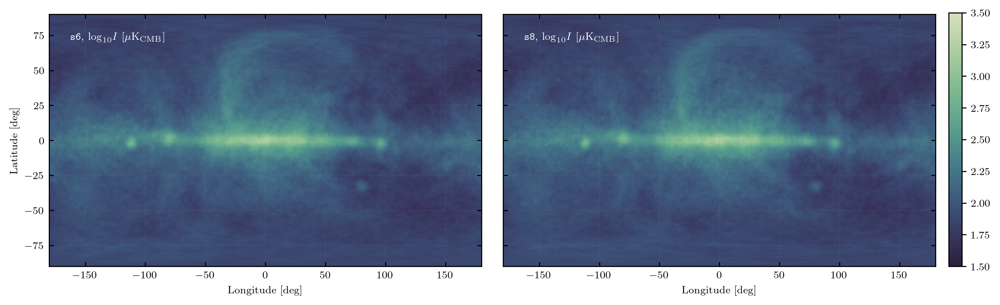

In [8]:

xsize = 4096
ysize = xsize//2

lon = np.linspace(-180., 180., xsize)
lat = np.linspace(-90., 90., ysize)

fig, ax = plt.subplots(1, 2, figsize=(3.5*4., 3.5), dpi=256)

cmap2 = sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True)
ax[0].pcolormesh(lon, lat, im1, cmap=cmap2, vmin=1.5, vmax=3.5)
cols = ax[1].pcolormesh(lon, lat, im2, cmap=cmap2, vmin=1.5, vmax=3.5)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.11, 0.01, 0.775])
fig.colorbar(cols, cax=cbar_ax)

for axx in ax:
    pretty_axes(axx)

ax[1].set_yticklabels([])
ax[0].set_ylabel('Latitude [deg]')
ax[0].set_xlabel('Longitude [deg]')
ax[1].set_xlabel('Longitude [deg]')

ax[0].text(0.05, 0.9, r'\texttt{s6}, $\mathrm{\log}_{10} I$ [$\mu \mathrm{K}_{\mathrm{CMB}}$]', transform=ax[0].transAxes, color='white')
ax[1].text(0.05, 0.9, r'\texttt{s8}, $\mathrm{\log}_{10} I$ [$\mu \mathrm{K}_{\mathrm{CMB}}$]', transform=ax[1].transAxes, color='white')

fig.subplots_adjust(wspace=0.05)


0.002816542906004056 1504.0967424006274


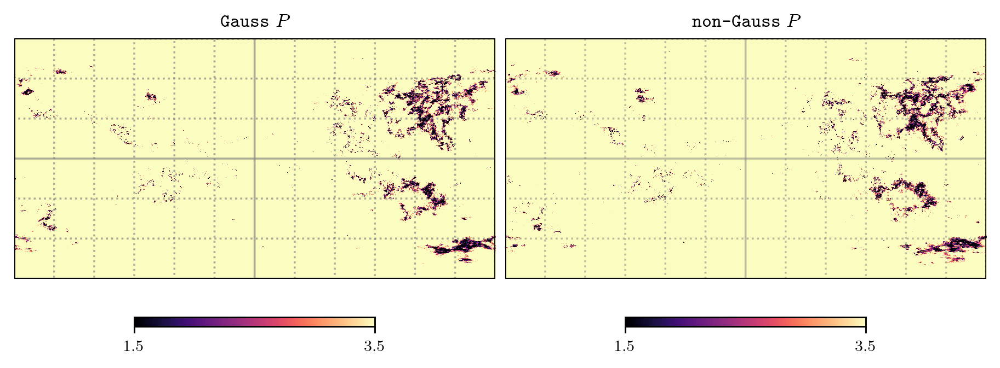

In [9]:
P2 = np.sqrt(field2[1]**2 + field2[2]**2)
P3 = np.sqrt(field3[1]**2 + field3[2]**2)

lon1 = 145.
lat1 = 0.
NPIX = 2048
DELTA_PIX = 1.7/60.
w = utils.w_object(NPIX, DELTA_PIX, lon1, lat1)
(w, patch) = utils.patch_creation(NPIX, DELTA_PIX, lon1, lat1)

fig = plt.figure(figsize=(7., 3.5), dpi=256)
cmin, cmax = 1.5, 3.5
print(np.nanmin(P3), np.nanmax(P3))
cmap2 = sns.color_palette('magma', as_cmap=True)#cmr.fusion_r

im1 = hp.cartview(P2, cmap=cmap2, title=r'\texttt{Gauss} $P$', fig=fig, sub=(1, 2, 1), min=cmin, max=cmax, xsize=4096, return_projected_map=True)
hp.graticule(alpha=0.25, color='gray')

im2 = hp.cartview(P3, cmap=cmap2, title=r'\texttt{non-Gauss} $P$', fig=fig, sub=(1, 2, 2), min=cmin, max=cmax, xsize=4096, return_projected_map=True)
hp.graticule(alpha=0.5, color='gray')

In [10]:
print(np.nanmin(np.log10(im1)), np.nanmax(np.log10(im1)))

-2.253933352456952 3.0574794251193245


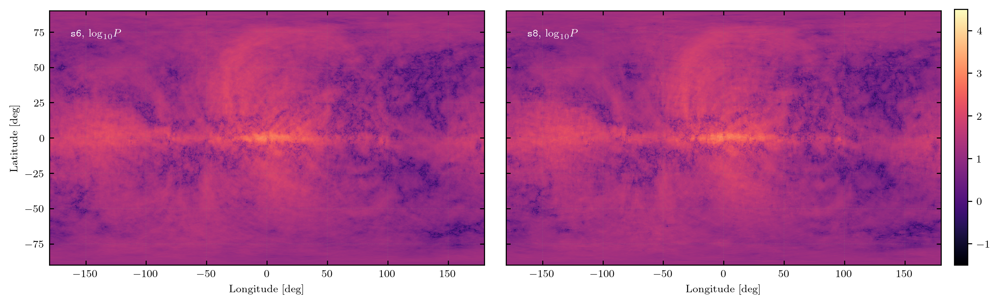

In [11]:

xsize = 4096
ysize = xsize//2

lon = np.linspace(-180., 180., xsize)
lat = np.linspace(-90., 90., ysize)

fig, ax = plt.subplots(1, 2, figsize=(3.5*4., 3.5), dpi=256)

cmap2 = sns.color_palette("magma", as_cmap=True)
ax[0].pcolormesh(lon, lat, np.log10(im1), cmap=cmap2, vmin=-1.5, vmax=4.5)
cols = ax[1].pcolormesh(lon, lat, np.log10(im2), cmap=cmap2, vmin=-1.5, vmax=4.5)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.11, 0.01, 0.775])
fig.colorbar(cols, cax=cbar_ax)

for axx in ax:
    pretty_axes(axx)

ax[1].set_yticklabels([])
ax[0].set_ylabel('Latitude [deg]')
ax[0].set_xlabel('Longitude [deg]')
ax[1].set_xlabel('Longitude [deg]')

ax[0].text(0.05, 0.9, r'\texttt{s6}, $\mathrm{\log}_{10} P$', transform=ax[0].transAxes, color='white')
ax[1].text(0.05, 0.9, r'\texttt{s8}, $\mathrm{\log}_{10} P$', transform=ax[1].transAxes, color='white')

fig.subplots_adjust(wspace=0.05)


Calculating spectrum
Calculating spectrum


/tmp/ipykernel_194365/1556294004.py:55: RuntimeWarning: invalid value encountered in divide
  ax2[i].plot(Cl2[0], Cl2[1][i]/Cl3[1][i], linestyle='-', linewidth=1., color='red')


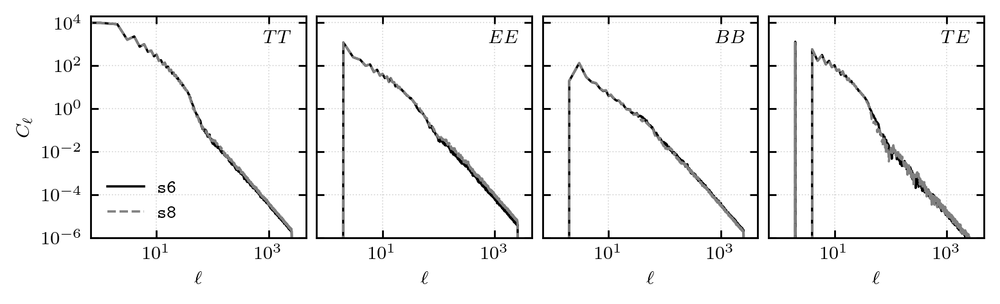

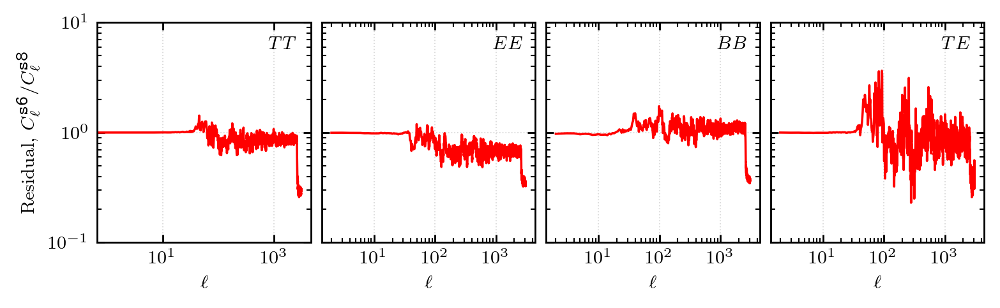

In [39]:

def calc_cl(map1, map2=None, mask=None, remove_dipole=False, pol=False, galcut=0., galcut_apo=None):
    """Calculate Cl

    Args:
        map1, map2: Maps for auto/cross spectra
        mask: Mask
        remove (bool): Remove the dipole
        pol (bool): If true, input [I,Q,U] maps
    Returns:
        ell, Dl
    """
    # gal_cut = (5.*u.degree).to(u.radian).value
    if galcut_apo is not None:
        cut_mask = hp.query_strip(512, np.pi/2.-galcut, np.pi/2.+galcut)
        mask = np.ones_like(map1[0])
        mask[cut_mask] = 0
        mask = hp.smoothing(mask, fwhm=galcut_apo)
        fsky = np.sum(mask)/len(mask)
        # print(fsky_5)
        galcut = 0.

    if map2 is None:
        cl_mask = hp.ma(map1)
        if mask is not None:
            cl_mask.mask = np.logical_not(mask)
        if remove_dipole:
            cl_mask = hp.remove_dipole(cl_mask)
        print('Calculating spectrum')
        Cl = hp.anafast(cl_mask, pol=pol, gal_cut=galcut)
        ell = np.arange(np.shape(Cl)[-1])
    else:
        ## Cross-spectrum
        cl_mask1 = hp.ma(map1)
        cl_mask2 = hp.ma(map2)
        if mask is not None:
            cl_mask1.mask = np.logical_not(mask)
            cl_mask2.mask = np.logical_not(mask)
        if remove_dipole:
            cl_mask1 = hp.remove_dipole(cl_mask1)
            cl_mask2 = hp.remove_dipole(cl_mask2)
        print('Calculating spectrum')
        Cl = hp.anafast(cl_mask1, cl_mask2, pol=pol, gal_cut=galcut)
        ell = np.arange(np.shape(Cl)[-1])
    return ell, Cl/fsky

fig, ax = plt.subplots(1, 4, figsize=(1.75*4., 1.75), dpi=256)
fig2, ax2 = plt.subplots(1, 4, figsize=(1.75*4., 1.75), dpi=256)

Cl2 = calc_cl(field2, galcut=10., galcut_apo=5., pol=True)
Cl3 = calc_cl(field3, galcut=10., galcut_apo=5., pol=True)
for i in range(4):
    ax[i].plot(Cl2[0], Cl2[1][i], linestyle='-', linewidth=1., color='black')
    ax[i].plot(Cl3[0], Cl3[1][i], linestyle='--', linewidth=1., color='gray')

    ax2[i].plot(Cl2[0], Cl2[1][i]/Cl3[1][i], linestyle='-', linewidth=1., color='red')
for axx in ax:
    axx.loglog()
    axx.set_ylim((1e-6, 2e4))
    pretty_axes(axx)
    axx.set_xlabel(r'$\ell$')

for axx in ax2:
    axx.loglog()
    axx.set_ylim((1e-1, 1e1))
    pretty_axes(axx)
    axx.set_xlabel(r'$\ell$')

ax[0].set_ylabel(r'$C_\ell$')
ax[1].set_yticklabels([])
ax[2].set_yticklabels([])
ax[3].set_yticklabels([])

ax[0].plot([], [], linestyle='-', linewidth=1., color='black', label=r'\texttt{s6}')
ax[0].plot([], [], linestyle='--', linewidth=1., color='gray', label=r'\texttt{s8}')
ax[0].legend(fancybox=False, frameon=False, loc='lower left')

ax[0].text(0.8, 0.88, r'$TT$', transform=ax[0].transAxes)
ax[1].text(0.8, 0.88, r'$EE$', transform=ax[1].transAxes)
ax[2].text(0.8, 0.88, r'$BB$', transform=ax[2].transAxes)
ax[3].text(0.8, 0.88, r'$TE$', transform=ax[3].transAxes)

ax2[0].set_ylabel(r'Residual, $C^{\texttt{s6}}_\ell / C^{\texttt{s8}}_\ell$')
ax2[1].set_yticklabels([])
ax2[2].set_yticklabels([])
ax2[3].set_yticklabels([])

ax2[0].text(0.8, 0.88, r'$TT$', transform=ax2[0].transAxes)
ax2[1].text(0.8, 0.88, r'$EE$', transform=ax2[1].transAxes)
ax2[2].text(0.8, 0.88, r'$BB$', transform=ax2[2].transAxes)
ax2[3].text(0.8, 0.88, r'$TE$', transform=ax2[3].transAxes)

fig.subplots_adjust(wspace=0.05)
fig2.subplots_adjust(wspace=0.05)


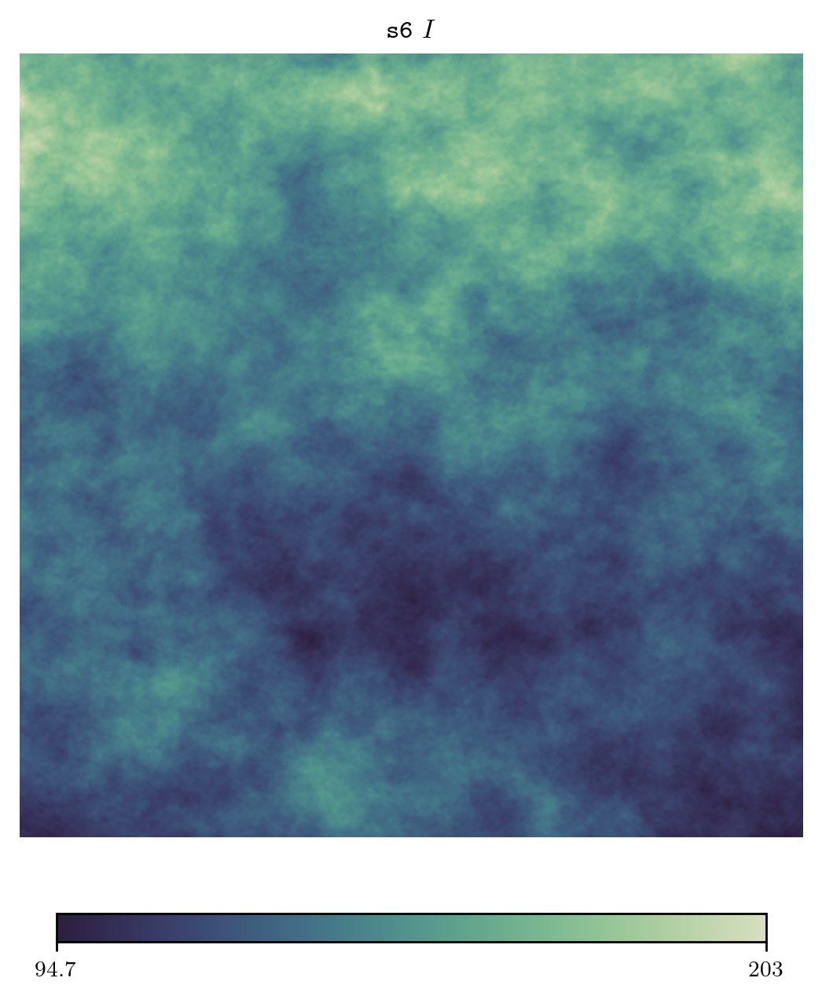

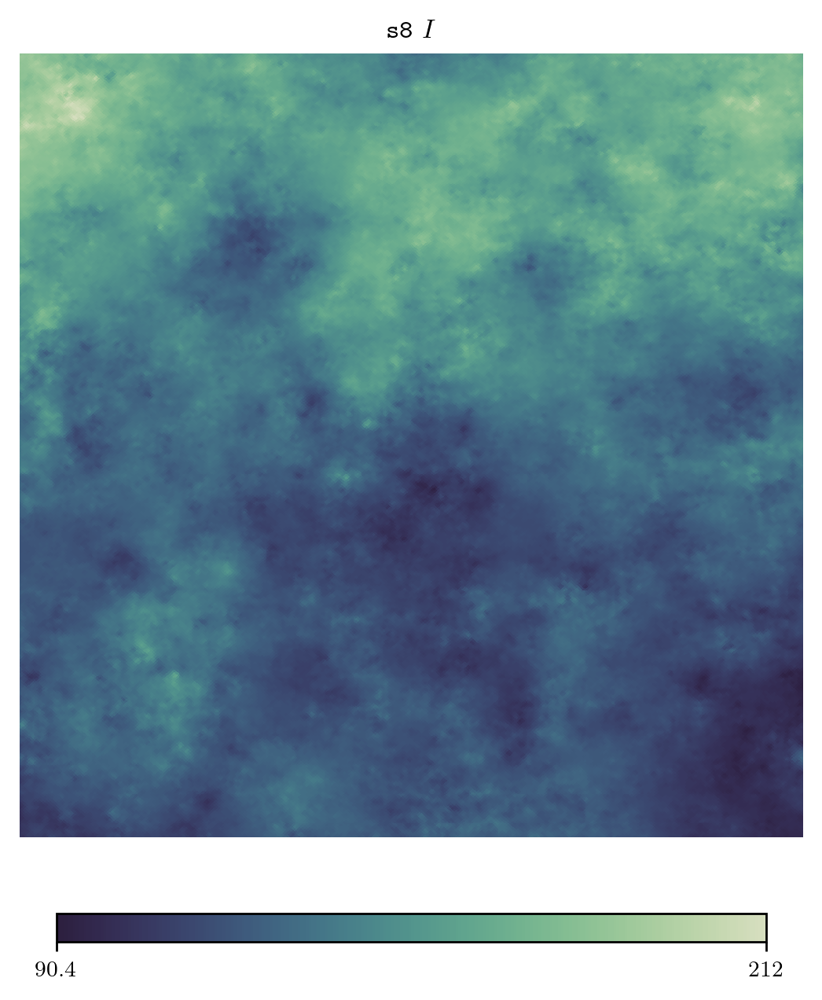

In [18]:
# im1 = hp.cartview(pr3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{PR3} $I$', xsize=1024, return_projected_map=True, lonra=[170,190], latra=[-20,0])
im2 = hp.cartview(field2[0], cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s6} $I$', xsize=1024, return_projected_map=True, lonra=[170,190], latra=[-20,0])
im3 = hp.cartview(field3[0], cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s8} $I$', xsize=1024, return_projected_map=True, lonra=[170,190], latra=[-20,0])

In [21]:
print(np.nanmin(im2), np.nanmax(im2))

94.73929494106822 202.74954017188333


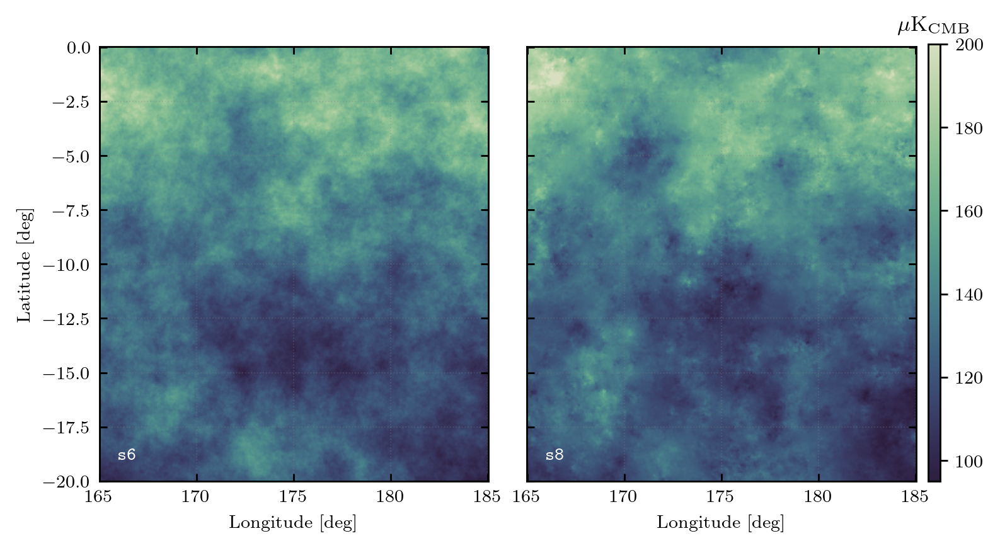

In [23]:

xsize = 1024
ysize = xsize

lon = np.linspace(165, 185, xsize)
lat = np.linspace(-20, 0, ysize)

fig, ax = plt.subplots(1, 2, figsize=(3.75*2., 3.5), dpi=256)

# cols = ax[0].pcolormesh(lon, lat, (im1*u.K_CMB).to_value(u.uK_CMB), cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=2500, vmax=27500)
cols = ax[0].pcolormesh(lon, lat, im2, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=95, vmax=200)
ax[1].pcolormesh(lon, lat, im3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=95, vmax=200)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.11, 0.01, 0.775])
fig.colorbar(cols, cax=cbar_ax)
cbar_ax.set_title(r'$\mu \mathrm{K}_{\mathrm{CMB}}$')

for axx in ax:
    pretty_axes(axx)
ax[1].set_yticklabels([])
# ax[2].set_yticklabels([])

ax[0].set_ylabel('Latitude [deg]')
ax[0].set_xlabel('Longitude [deg]')
ax[1].set_xlabel('Longitude [deg]')
# ax[2].set_xlabel('Longitude [deg]')

ax[0].text(0.05, 0.05, r'\texttt{s6}', transform=ax[0].transAxes, color='white')
ax[1].text(0.05, 0.05, r'\texttt{s8}', transform=ax[1].transAxes, color='white')
# ax[2].text(0.05, 0.05, r'\texttt{s8}', transform=ax[2].transAxes, color='white')

fig.subplots_adjust(wspace=0.1)


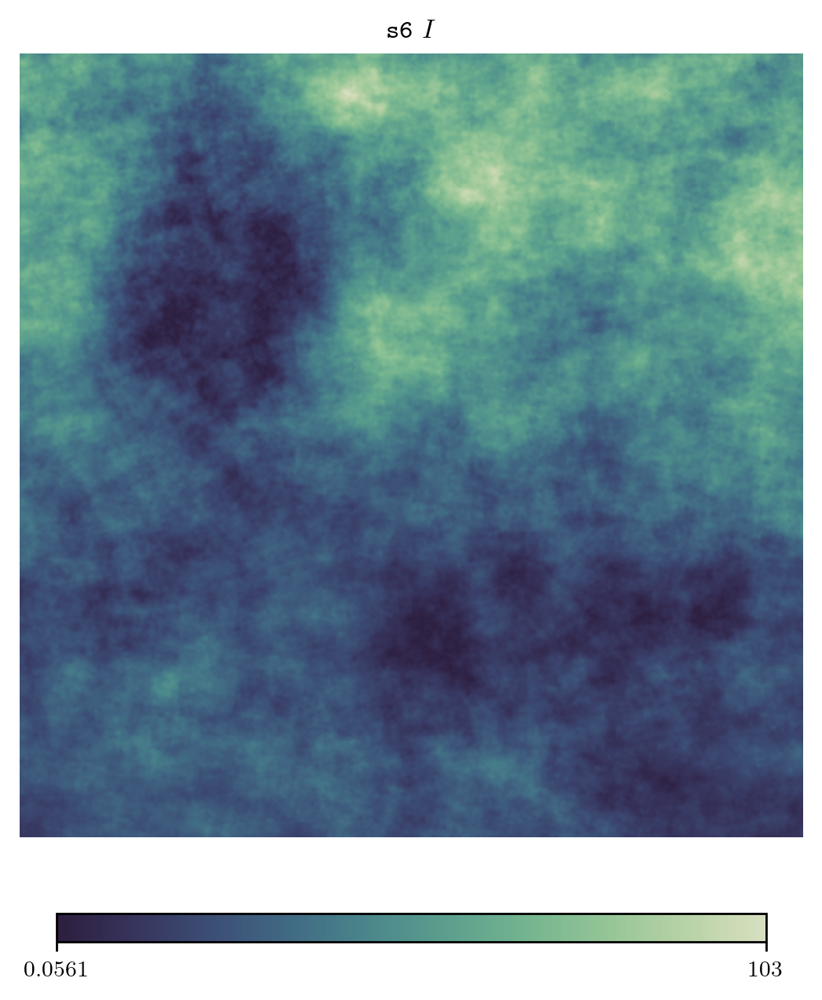

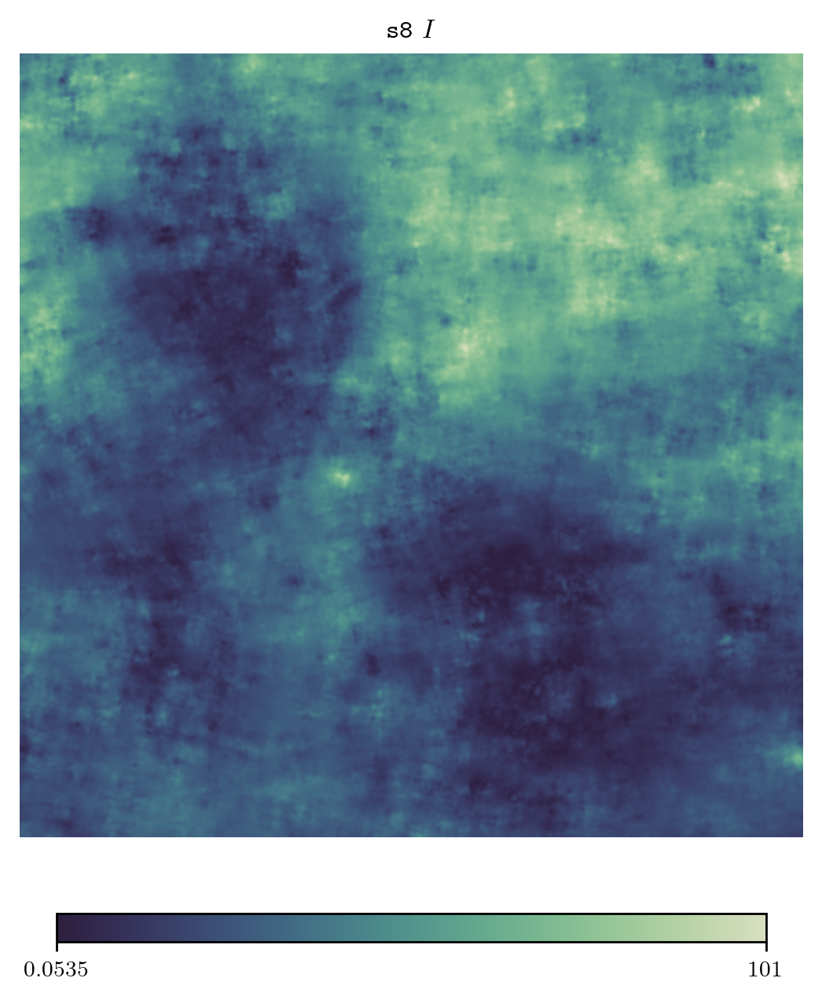

In [29]:
# im1 = hp.cartview(pr3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{PR3} $I$', xsize=1024, return_projected_map=True, lonra=[170,190], latra=[-20,0])
im2 = hp.cartview(P2, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s6} $I$', xsize=1024, return_projected_map=True, lonra=[170,190], latra=[-20,0])
im3 = hp.cartview(P3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s8} $I$', xsize=1024, return_projected_map=True, lonra=[170,190], latra=[-20,0])

In [30]:
print(np.nanmin(im2), np.nanmax(im2))

0.056115572962189365 102.87291109841689


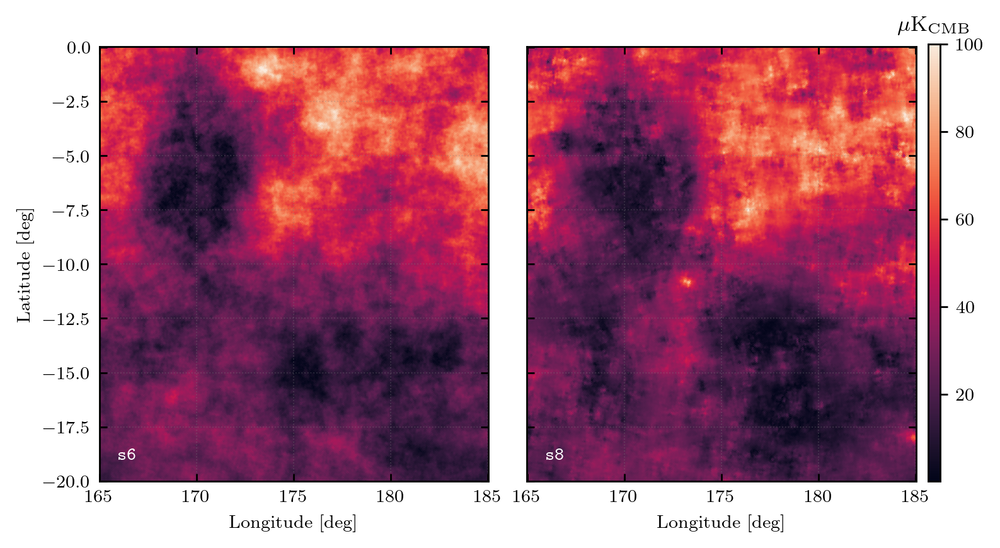

In [32]:

xsize = 1024
ysize = xsize

lon = np.linspace(165, 185, xsize)
lat = np.linspace(-20, 0, ysize)

fig, ax = plt.subplots(1, 2, figsize=(3.75*2., 3.5), dpi=256)

# cols = ax[0].pcolormesh(lon, lat, (im1*u.K_CMB).to_value(u.uK_CMB), cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=2500, vmax=27500)
cols = ax[0].pcolormesh(lon, lat, im2, cmap=sns.color_palette("rocket", as_cmap=True), vmin=0.05, vmax=100)
ax[1].pcolormesh(lon, lat, im3, cmap=sns.color_palette("rocket", as_cmap=True), vmin=0.05, vmax=100)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.11, 0.01, 0.775])
fig.colorbar(cols, cax=cbar_ax)
cbar_ax.set_title(r'$\mu \mathrm{K}_{\mathrm{CMB}}$')

for axx in ax:
    pretty_axes(axx)
ax[1].set_yticklabels([])
# ax[2].set_yticklabels([])

ax[0].set_ylabel('Latitude [deg]')
ax[0].set_xlabel('Longitude [deg]')
ax[1].set_xlabel('Longitude [deg]')
# ax[2].set_xlabel('Longitude [deg]')

ax[0].text(0.05, 0.05, r'\texttt{s6}', transform=ax[0].transAxes, color='white')
ax[1].text(0.05, 0.05, r'\texttt{s8}', transform=ax[1].transAxes, color='white')
# ax[2].text(0.05, 0.05, r'\texttt{s8}', transform=ax[2].transAxes, color='white')

fig.subplots_adjust(wspace=0.1)


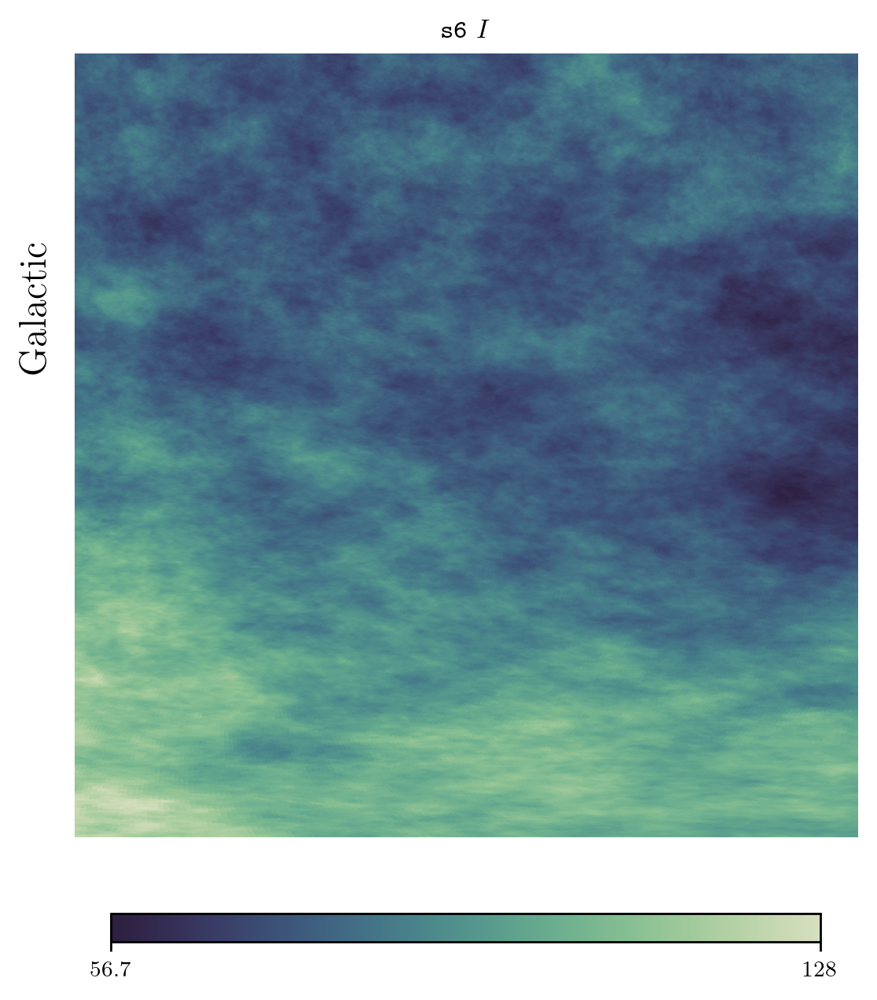

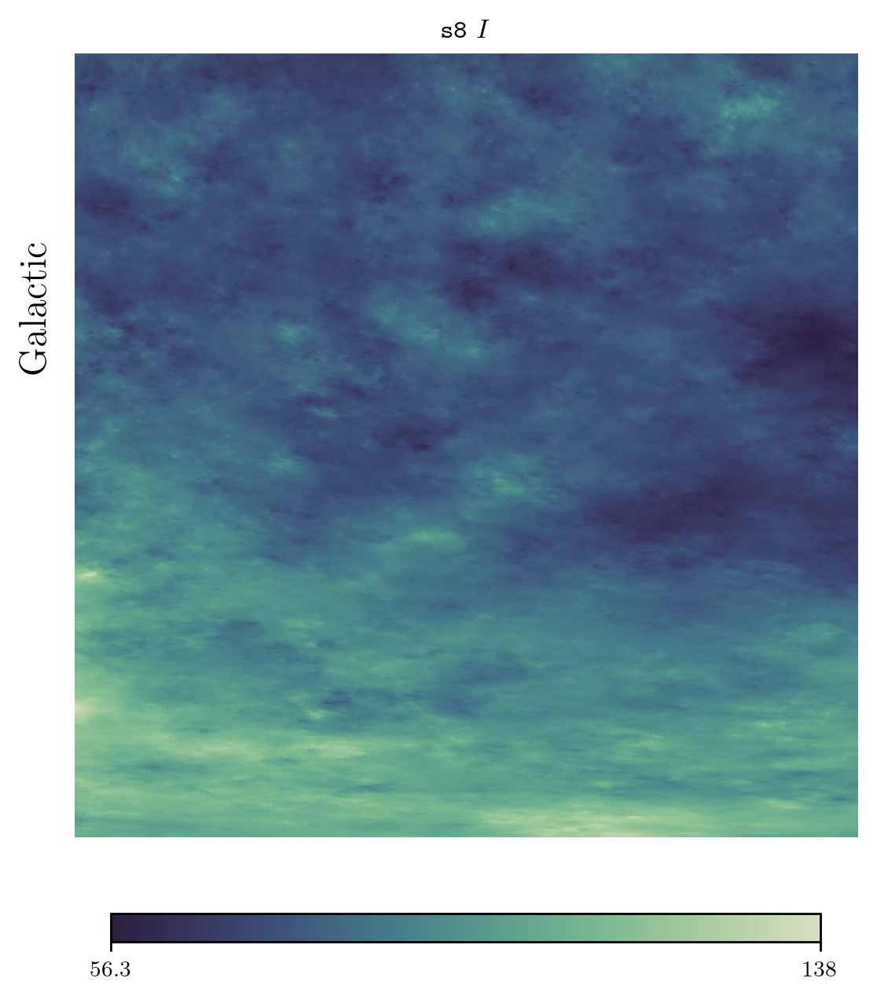

In [26]:
# im1 = hp.cartview(pr3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{PR3} $I$', xsize=1024, return_projected_map=True, lonra=[300, 340], latra=[-80,-40], coord=['C', 'G'])
im2 = hp.cartview(field2[0], cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s6} $I$', xsize=1024, return_projected_map=True, lonra=[300, 340], latra=[-80,-40], coord=['C', 'G'])
im3 = hp.cartview(field3[0], cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s8} $I$', xsize=1024, return_projected_map=True, lonra=[300, 340], latra=[-80,-40], coord=['C', 'G'])

In [27]:
print(np.nanmin(im2), np.nanmax(im2))

56.673070966601905 127.61541492185428


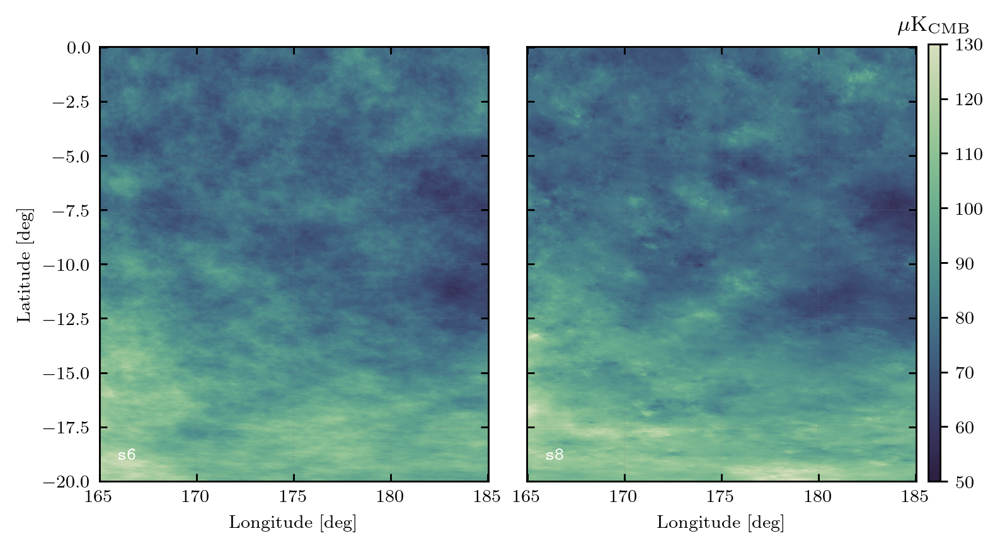

In [28]:

xsize = 1024
ysize = xsize

lon = np.linspace(165, 185, xsize)
lat = np.linspace(-20, 0, ysize)

fig, ax = plt.subplots(1, 2, figsize=(3.75*2., 3.5), dpi=256)

# cols = ax[0].pcolormesh(lon, lat, (im1*u.K_CMB).to_value(u.uK_CMB), cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=250, vmax=2000)
cols = ax[0].pcolormesh(lon, lat, im2, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=50, vmax=130)
ax[1].pcolormesh(lon, lat, im3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=50, vmax=130)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.11, 0.01, 0.775])
fig.colorbar(cols, cax=cbar_ax)
cbar_ax.set_title(r'$\mu \mathrm{K}_{\mathrm{CMB}}$')

for axx in ax:
    pretty_axes(axx)
ax[1].set_yticklabels([])
# ax[2].set_yticklabels([])

ax[0].set_ylabel('Latitude [deg]')
ax[0].set_xlabel('Longitude [deg]')
ax[1].set_xlabel('Longitude [deg]')
# ax[2].set_xlabel('Longitude [deg]')

ax[0].text(0.05, 0.05, r'\texttt{s6}', transform=ax[0].transAxes, color='white')
ax[1].text(0.05, 0.05, r'\texttt{s8}', transform=ax[1].transAxes, color='white')
# ax[2].text(0.05, 0.05, r'\texttt{s8}', transform=ax[2].transAxes, color='white')

fig.subplots_adjust(wspace=0.1)


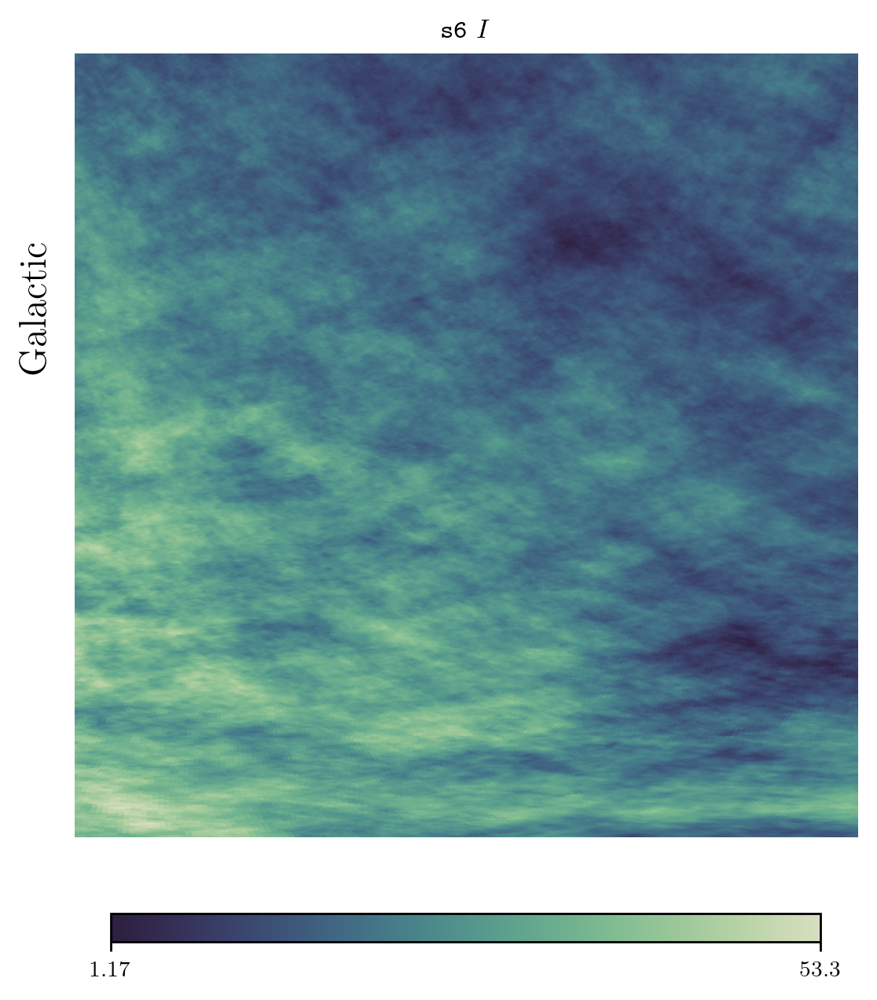

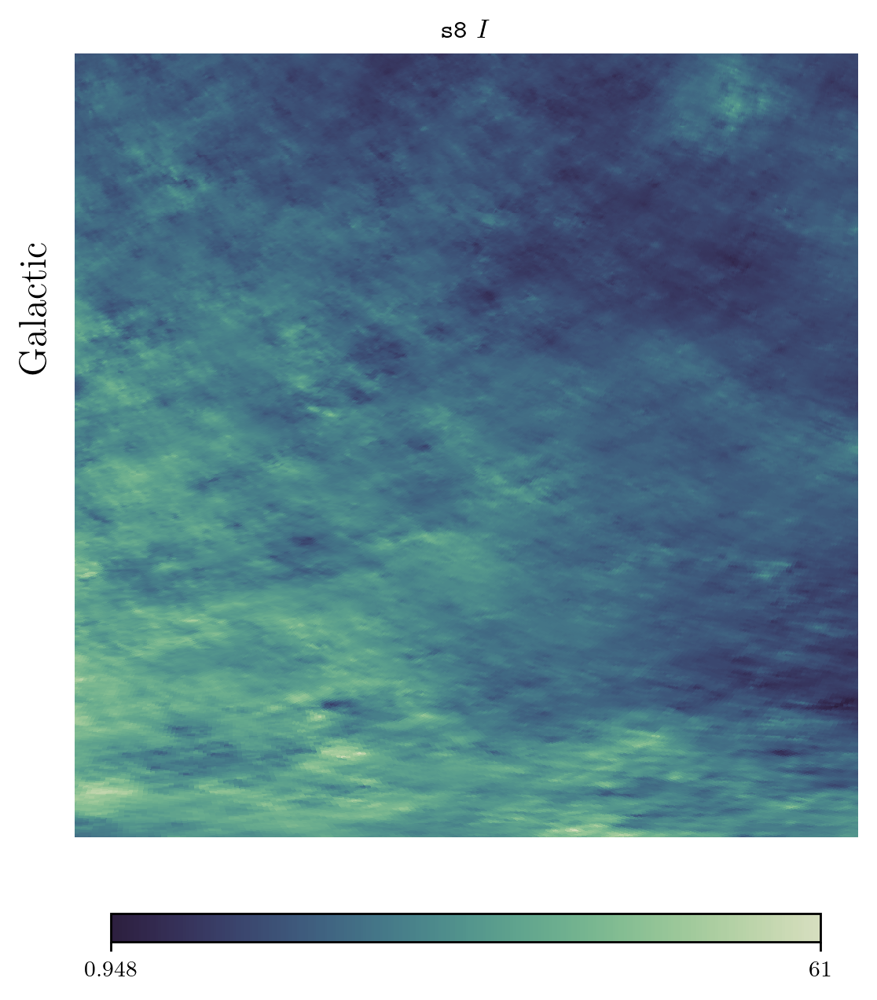

In [33]:
# im1 = hp.cartview(pr3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{PR3} $I$', xsize=1024, return_projected_map=True, lonra=[300, 340], latra=[-80,-40], coord=['C', 'G'])
im2 = hp.cartview(P2, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s6} $I$', xsize=1024, return_projected_map=True, lonra=[300, 340], latra=[-80,-40], coord=['C', 'G'])
im3 = hp.cartview(P3, cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), title=r'\texttt{s8} $I$', xsize=1024, return_projected_map=True, lonra=[300, 340], latra=[-80,-40], coord=['C', 'G'])

In [34]:
print(np.nanmin(im2), np.nanmax(im2))

1.1726833700616046 53.3150047189951


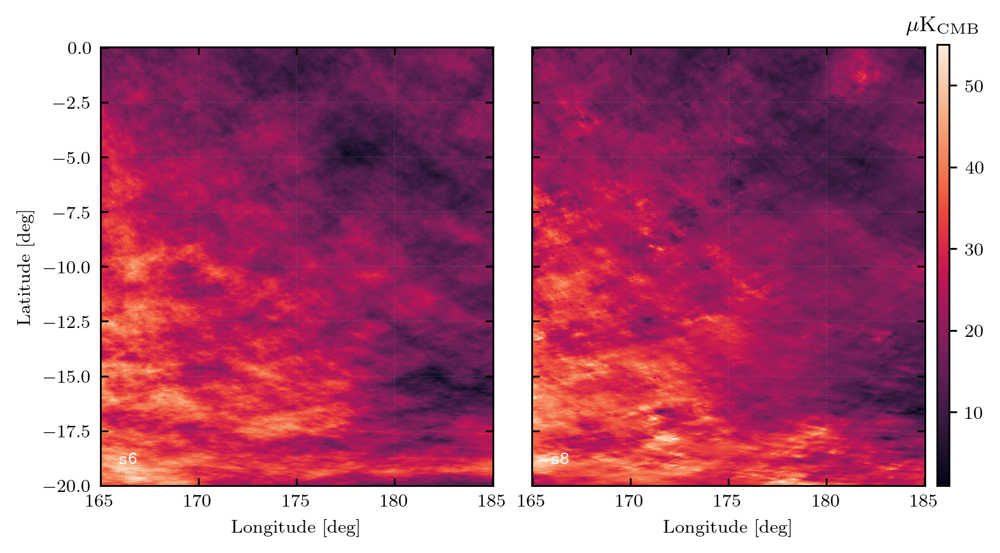

In [36]:

xsize = 1024
ysize = xsize

lon = np.linspace(165, 185, xsize)
lat = np.linspace(-20, 0, ysize)

fig, ax = plt.subplots(1, 2, figsize=(3.75*2., 3.5), dpi=256)

# cols = ax[0].pcolormesh(lon, lat, (im1*u.K_CMB).to_value(u.uK_CMB), cmap=sns.cubehelix_palette(start=.5, rot=-.75, as_cmap=True, reverse=True), vmin=250, vmax=2000)
cols = ax[0].pcolormesh(lon, lat, im2, cmap=sns.color_palette("rocket", as_cmap=True), vmin=1., vmax=55)
ax[1].pcolormesh(lon, lat, im3, cmap=sns.color_palette("rocket", as_cmap=True), vmin=1., vmax=55)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.81, 0.11, 0.01, 0.775])
fig.colorbar(cols, cax=cbar_ax)
cbar_ax.set_title(r'$\mu \mathrm{K}_{\mathrm{CMB}}$')

for axx in ax:
    pretty_axes(axx)
ax[1].set_yticklabels([])
# ax[2].set_yticklabels([])

ax[0].set_ylabel('Latitude [deg]')
ax[0].set_xlabel('Longitude [deg]')
ax[1].set_xlabel('Longitude [deg]')
# ax[2].set_xlabel('Longitude [deg]')

ax[0].text(0.05, 0.05, r'\texttt{s6}', transform=ax[0].transAxes, color='white')
ax[1].text(0.05, 0.05, r'\texttt{s8}', transform=ax[1].transAxes, color='white')
# ax[2].text(0.05, 0.05, r'\texttt{s8}', transform=ax[2].transAxes, color='white')

fig.subplots_adjust(wspace=0.1)
